In [1]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from src.utilities.surface_utils import get_thresholded_curv, get_thresholded_thickness, find_label_boundary
from src.utilities.geometry_utils import get_faces_from_vertices 
import matplotlib.pyplot as plt


In [6]:

from src.classes.subject import ScalpelSubject

sub_rh = ScalpelSubject('100307', 'lh', subjects_dir='/Users/benparker/Desktop/cnl/subjects/')

sub_rh.load_label('IPS')
sub_rh.load_label('IPS-PO')
## combine i and plot
sub_rh.load_label('pips')
sub_rh.load_label('sB')  


combined_i_label_ind = np.concatenate((sub_rh.labels['pips'].vertex_indexes, sub_rh.labels['sB'].vertex_indexes, sub_rh.labels['IPS-PO'].vertex_indexes))
combined_i_label_ras = np.concatenate((sub_rh.labels['pips'].ras_coords, sub_rh.labels['sB'].ras_coords, sub_rh.labels['IPS-PO'].ras_coords))

sub_rh.load_label('combined_i', combined_i_label_ind, combined_i_label_ras)
sub_rh.load_label('IPS')

# sub_rh.plot_label('IPS', face_colors='purple')
# sub_rh.plot_label('combined_i', face_colors='yellow')

In [7]:
## combine labels 1 and 2
combined_label_ind = np.hstack((sub_rh.labels['IPS'].vertex_indexes, sub_rh.labels['combined_i'].vertex_indexes))
combined_label_RAS = sub_rh.ras_coords[combined_label_ind]

## PCA on these labels
# Step 1: Standardize the data
scaler = StandardScaler()
label_12_faces = get_faces_from_vertices(sub_rh.faces, combined_label_ind)
label_12_boundary = find_label_boundary(label_12_faces)
label_12_boundary_RAS = sub_rh.ras_coords[label_12_boundary]
points_scaled = scaler.fit_transform(label_12_boundary_RAS)

# Step 2: Apply PCA
pca = PCA(n_components=2)  
points_pca = pca.fit_transform(points_scaled)

points_for_clustering = points_pca[:, 0].reshape(-1, 1)
label1_points = points_for_clustering[np.isin(label_12_boundary, sub_rh.labels['IPS'].vertex_indexes)]
label2_points = points_for_clustering[np.isin(label_12_boundary, sub_rh.labels['combined_i'].vertex_indexes)]

Ag_clust_1 = AgglomerativeClustering(n_clusters=2).fit_predict(label1_points)
Ag_clust_2 = AgglomerativeClustering(n_clusters=3).fit_predict(label2_points)
clusters2_adjusted = Ag_clust_2 + 5
Ag_clust_3 = AgglomerativeClustering(n_clusters=5).fit_predict(points_for_clustering)




In [9]:
cluster_merged = []
cluster_1_copy = np.copy(Ag_clust_1)
cluster_2_copy = np.copy(clusters2_adjusted)

for i, boundary_ind in enumerate(label_12_boundary):
    if np.isin(boundary_ind, sub_rh.labels['IPS'].vertex_indexes):
        cluster_merged.append(cluster_1_copy[0])
        cluster_1_copy = cluster_1_copy[1:]
    elif np.isin(boundary_ind, sub_rh.labels['combined_i'].vertex_indexes):
        cluster_merged.append(cluster_2_copy[0])
        cluster_2_copy = cluster_2_copy[1:]

cluster_merged = np.array(cluster_merged)

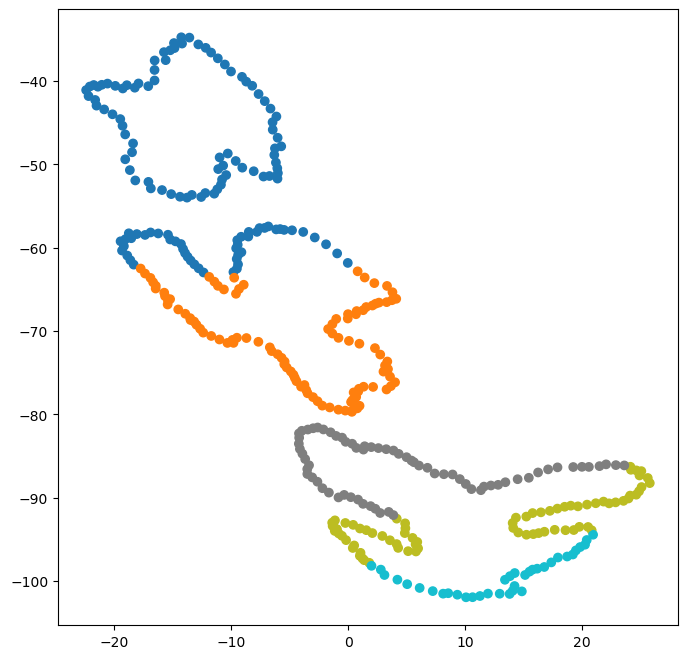

In [10]:
plt.figure(figsize=(8,8))

scatter = plt.scatter(label_12_boundary_RAS[:, 0], label_12_boundary_RAS[:, 1], c=cluster_merged, cmap='tab10')
plt.show()

In [11]:
label_1_boundary_inds = np.where(label_12_boundary[np.isin(label_12_boundary, sub_rh.labels['IPS'].vertex_indexes)])
label_2_boundary_inds = np.where(label_12_boundary[np.isin(label_12_boundary, sub_rh.labels['combined_i'].vertex_indexes)])

In [12]:
cluster_merged_label1 = cluster_merged[label_1_boundary_inds]
cluster_merged_label2 = cluster_merged[label_2_boundary_inds]

In [13]:
from scipy.spatial.distance import cdist

cluster_1_inds = [0, 1]
cluster_2_inds = [5, 6, 7]
set1 = [label_12_boundary_RAS[cluster_merged == cluster_1_inds[i]] for i in range(len(cluster_1_inds))]
set2 = [label_12_boundary_RAS[cluster_merged == cluster_2_inds[i]] for i in range(len(cluster_2_inds))]


# Function to compute the median of pairwise distances between two arrays
def median_pairwise_distance(array1, array2):
    distances = cdist(array1, array2, 'euclidean')
    return np.median(distances)

# Initialize minimum median distance to a large number
min_median_distance = float('inf')
closest_arrays = None

# Calculate the median pairwise distance for each pair of arrays (one from each set)
for i, array1 in enumerate(set1):
    for j, array2 in enumerate(set2):
        median_distance = median_pairwise_distance(array1, array2)
        if median_distance < min_median_distance:
            min_median_distance = median_distance
            closest_arrays = (i, j)

# Output the result
closest_set1_array = set1[closest_arrays[0]]
closest_set2_array = set2[closest_arrays[1]]
print(f"The closest arrays are array {closest_arrays[0]} from set 1 and array {closest_arrays[1]} from set 2 with a median distance of {min_median_distance}.")



The closest arrays are array 1 from set 1 and array 0 from set 2 with a median distance of 22.384526028464368.


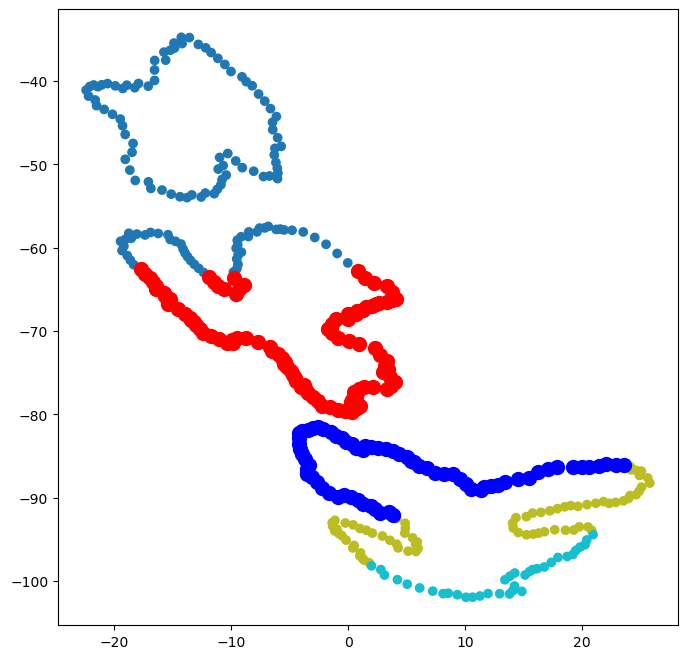

In [14]:
## scatter plot closest_set1_array and closest_set2_array
plt.figure(figsize=(8,8))

scatter = plt.scatter(label_12_boundary_RAS[:, 0], label_12_boundary_RAS[:, 1], c=cluster_merged, cmap='tab10')
plt.scatter(closest_set1_array[:, 0], closest_set1_array[:, 1], c='red', s=100)
plt.scatter(closest_set2_array[:, 0], closest_set2_array[:, 1], c='blue', s=100)
plt.show()



In [15]:
# Clustered gyrus
from src.utilities.surface_utils import cluster_label_KMeans

cluster_kmeans = cluster_label_KMeans(sub_rh.gyrus[0], sub_rh.ras_coords, n_clusters=300)

In [16]:
cluster_masked = cluster_merged.copy()
mask1 = np.equal(cluster_masked, cluster_1_inds[closest_arrays[0]])
mask2 = np.equal(cluster_masked, cluster_2_inds[closest_arrays[1]])

In [17]:
label_1_cluster_boundary = label_12_boundary[mask1]
label_2_cluster_boundary = label_12_boundary[mask2]

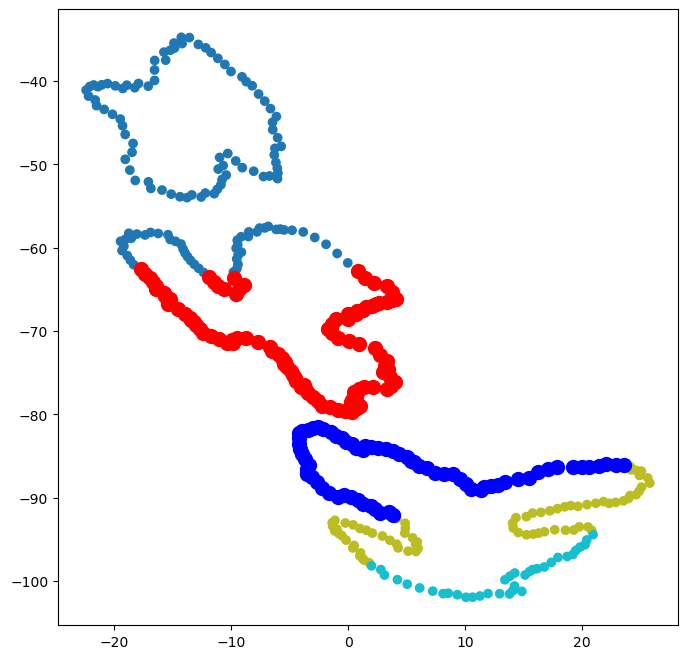

In [18]:
plt.figure(figsize=(8,8))

plt.scatter(label_12_boundary_RAS[:, 0], label_12_boundary_RAS[:, 1], c=cluster_masked, cmap='tab10')
plt.scatter(sub_rh.ras_coords[label_1_cluster_boundary][:, 0], sub_rh.ras_coords[label_1_cluster_boundary][:, 1], c='red', s=100)
plt.scatter(sub_rh.ras_coords[label_2_cluster_boundary][:, 0], sub_rh.ras_coords[label_2_cluster_boundary][:, 1], c='blue', s=100)

plt.show()

In [19]:
## adjacent points to label_1_cluster_boundary

label_1_cluster_boundary_faces = get_faces_from_vertices(sub_rh.faces, label_1_cluster_boundary, include_all=False)
label_1_cluster_boundary_neighbors = np.unique(label_1_cluster_boundary_faces)

label_2_cluster_boundary_faces = get_faces_from_vertices(sub_rh.faces, label_2_cluster_boundary, include_all=False)
label_2_cluster_boundary_neighbors = np.unique(label_2_cluster_boundary_faces)


In [20]:
boundary_face_ex = []
for face in sub_rh.faces:
    if np.any([point in label_1_cluster_boundary for point in face]):
        boundary_face_ex.append(face)

boundary_face_ex_ind = np.unique(boundary_face_ex)

In [21]:
boundary_face_ex_2 = []
for face in sub_rh.faces:
    if np.any([point in label_2_cluster_boundary for point in face]):
        boundary_face_ex_2.append(face)

boundary_face_ex_ind_2 = np.unique(boundary_face_ex_2)

In [22]:
## threshold boundary neigbors by gyral regions

label_1_cluster_boundary_neighbors_gyral = np.intersect1d(boundary_face_ex_ind, sub_rh.gyrus[0])
label_2_cluster_boundary_neighbors_gyral = np.intersect1d(boundary_face_ex_ind_2, sub_rh.gyrus[0])

In [23]:
## get index of each element o label_1_cluster_boundary_neighbors_gyral in sub_rh.gyrus[0]

label_1_cluster_boundary_neighbors_gyral_ind = np.where(np.isin(sub_rh.gyrus[0], label_1_cluster_boundary_neighbors_gyral))[0]
label_2_cluster_boundary_neighbors_gyral_ind = np.where(np.isin(sub_rh.gyrus[0], label_2_cluster_boundary_neighbors_gyral))[0]

In [24]:
label_1_neighbor_gyral_clusters = np.unique(cluster_kmeans[label_1_cluster_boundary_neighbors_gyral_ind])
label_2_neighbor_gyral_clusters = np.unique(cluster_kmeans[label_2_cluster_boundary_neighbors_gyral_ind])

shared_gyral_clusters = np.intersect1d(label_1_neighbor_gyral_clusters, label_2_neighbor_gyral_clusters)

In [25]:
shared_gyral_mask = np.isin(cluster_kmeans, shared_gyral_clusters)
shared_gyral_index = sub_rh.gyrus[0][shared_gyral_mask]
shared_gyral_ras = sub_rh.ras_coords[shared_gyral_index]

In [27]:

sub_rh.load_label('shared_gyral_clusters', shared_gyral_index)
sub_rh.plot_label('IPS', face_colors='purple') 
sub_rh.plot_label('shared_gyral_clusters', face_colors='navy')


Initial plot builds cortical mesh (1 - 2 minutes)
